# はじめに

ここでは、Twitterの情報をKivyで表示するアプリを作ってみる。


# 某絵師のTwitter投稿ページを覗いてみる

とりあえず、mediaページを開いてそれっぽい画像URLを抽出してGetしてみる。

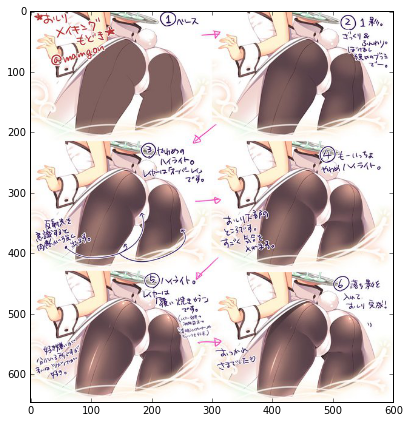

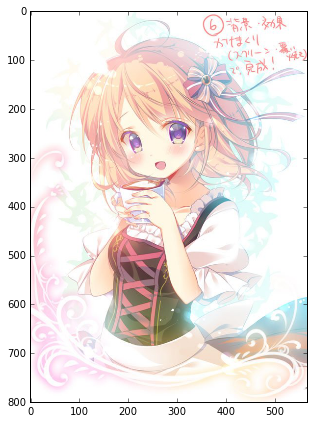

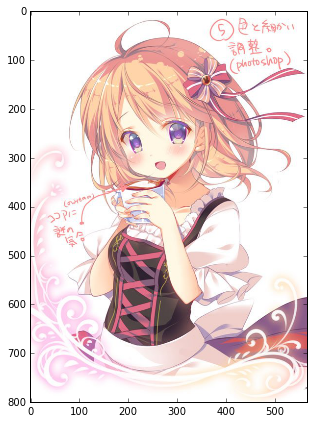

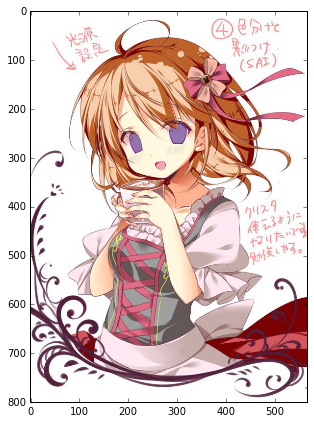

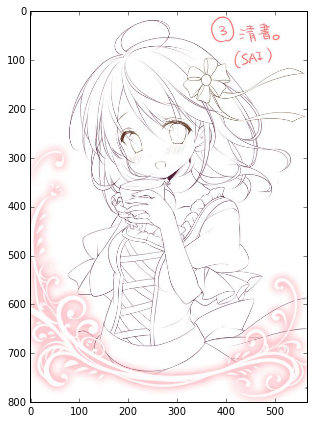

...

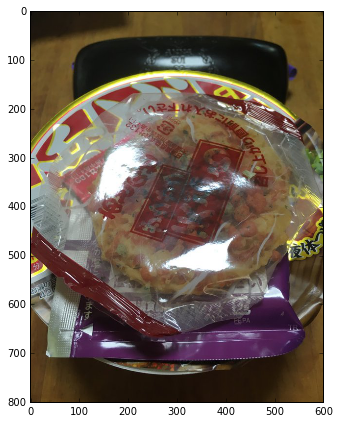

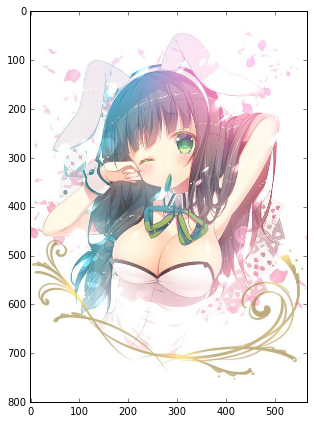

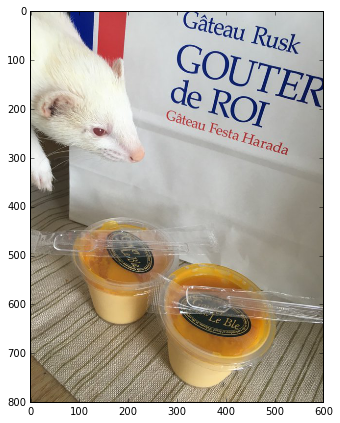

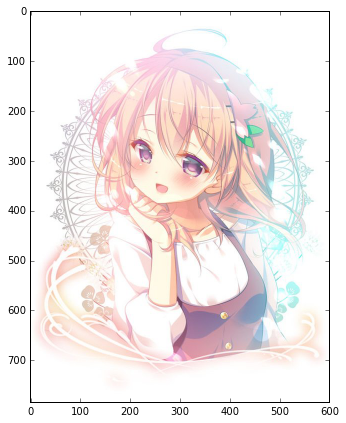

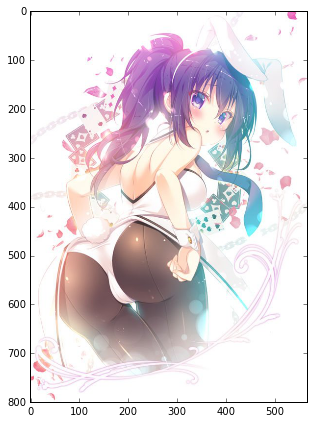

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import tempfile
import shutil
import requests
from bs4 import BeautifulSoup
%matplotlib inline

const_twitter_media_url = "https://twitter.com/mamgon/media"
const_img_pattern = re.compile(".*\/media\/.*jpg")

# temp_dir = tempfile.mkdtemp()
# os.mkdir('puripuri')
temp_dir = './puripuri'

r = requests.get(const_twitter_media_url)
soup = BeautifulSoup(r.text, "lxml")
for idx, img_tag in enumerate(soup.findAll("img", {'src':const_img_pattern})):
    img_url = img_tag["src"]
    temp_file_name = 'temp_img_' + str(idx) + "_.jpg"
        
    # いったん、Tempとして保存
    r = requests.get(img_url, stream=True)
    if r.status_code == 200:
        file_full_name = os.path.join(temp_dir, temp_file_name)
        with open(file_full_name, 'wb') as f:
            for chunk in r.iter_content(1024):
                f.write(chunk)

        # 画像データをロード
        img = mpimg.imread(file_full_name)

        # matplotlib を使って画像を表示
        fig = plt.figure(figsize=(7,7)) # 描画用の領域を用意
        ax1 = fig.add_subplot(1,1,1)    # 引数はそれぞれ 縦数、横数、index 
        ax1.imshow(img)
        
# remove the temp dir.
# shutil.rmtree(temp_dir)

## もう少し改良

### 次のページをロードできるようにする。

Twitterのページは画面下部までスクロールすると、次ページが表示される仕組みになっている。
そこで、PhantomJS の力を借りて実際に Twitter のページのスクロールを行った。
コアとなるコードは以下の通り。

```
driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
```

ちなみに、driver で取得した HTML のソースを BeautifulSoup に食わせるには以下のコードを使えば良い。

```
soup = BeautifulSoup(driver.page_source, "lxml")
```


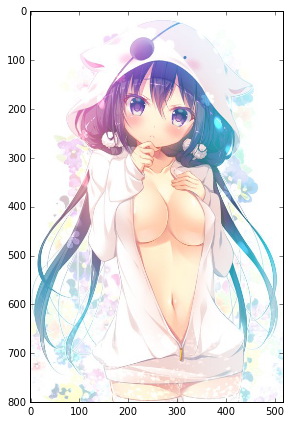

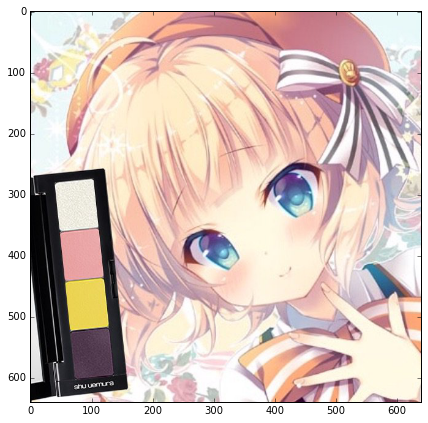

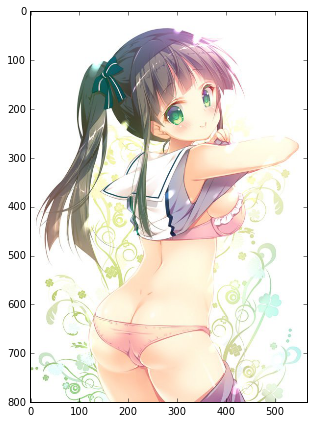

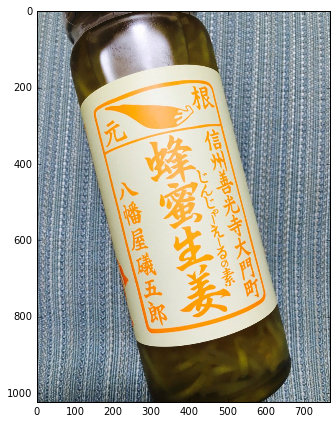

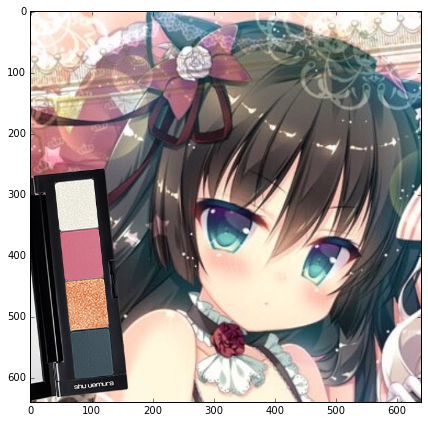

...

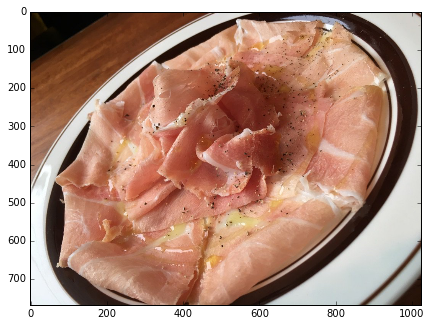

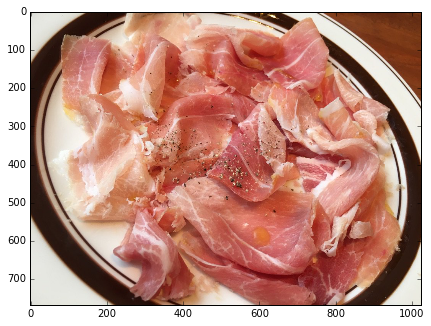

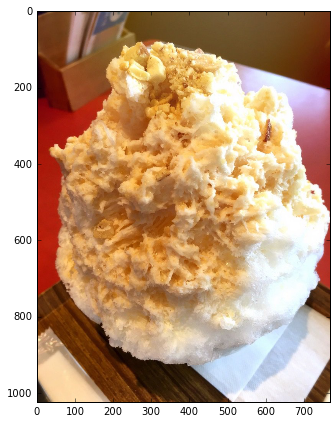

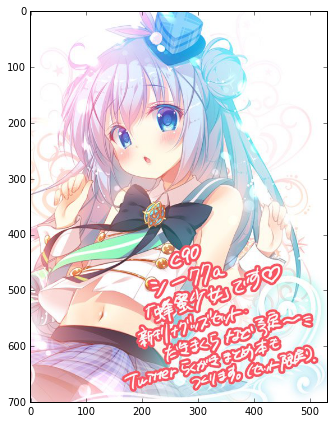

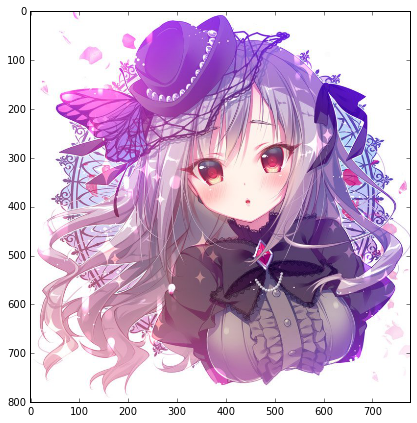

In [1]:
import sys
sys.path.append('./twitter')
import get_twitter_illust as gti
import imp
imp.reload(gti)
%matplotlib inline

gti.main_func()


In [6]:
import sys
sys.path.append('./twitter')
import get_twitter_illust as gti
import imp
imp.reload(gti)
%matplotlib inline

gti.main_func()

Page is ready!
Page is ready!
Page is ready!
./puripuri\temp_img_0_.jpg
./puripuri\temp_img_1_.jpg
./puripuri\temp_img_2_.jpg
./puripuri\temp_img_3_.jpg
./puripuri\temp_img_4_.jpg
./puripuri\temp_img_5_.jpg
./puripuri\temp_img_6_.jpg
./puripuri\temp_img_7_.jpg
./puripuri\temp_img_8_.jpg
./puripuri\temp_img_9_.jpg
./puripuri\temp_img_10_.jpg
./puripuri\temp_img_11_.jpg
./puripuri\temp_img_12_.jpg
./puripuri\temp_img_13_.jpg
./puripuri\temp_img_14_.jpg
./puripuri\temp_img_15_.jpg
./puripuri\temp_img_16_.jpg
./puripuri\temp_img_17_.jpg
./puripuri\temp_img_18_.jpg
./puripuri\temp_img_19_.jpg
